In [1]:
from __future__ import print_function, division

import os
import random
import numpy as np
import itertools

from keras.layers import Input, Dense, Conv2D, BatchNormalization, MaxPooling2D, UpSampling2D, Flatten
from keras.layers import BatchNormalization, Activation, Conv2D, Conv2DTranspose, Dropout, Reshape, Concatenate
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.preprocessing import image
import keras.backend as K
import h5py

import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


In [2]:
def load_dataset(path):
    files = os.listdir(path)
    x = []
    y = []
    for file in files: # number of files to go through
        im = np.asarray(image.load_img(os.path.join(path, file), target_size=(64,64)))
        lb = int(file.split('_')[0])
        nlb = np.asarray([lb])
        x.append(im)
        y.append(nlb)
    x = np.asarray(x)
    y = np.asarray(y)
    return x, y

In [3]:
path_train_orig = './Food11_256/training_256_datestamp'
path_val_orig = './Food11_256/validation_256_datestamp'
path_test_orig = './Food11_256/evaluation_256_datestamp'
x_train, y_train = load_dataset(path_train_orig)
x_val, y_val = load_dataset(path_val_orig)
x_test, y_test  = load_dataset(path_test_orig)

print(x_train.shape)

(9860, 64, 64, 3)


In [4]:
path_train_date = './Food11_256/training_256_datestamp'
path_val_date = './Food11_256/validation_256_datestamp'
path_test_date = './Food11_256/evaluation_256_datestamp'

x_train_date, y_train_date = load_dataset(path_train_date)
x_val_date, y_val_date = load_dataset(path_val_date)
x_test_date, y_test_date  = load_dataset(path_test_date)

print(x_train.shape)

(9860, 64, 64, 3)


In [5]:
def get_generator(input_layer):

    hid = Dense(128 * 16 * 16, activation='relu')(input_layer)    
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)
    hid = Reshape((16, 16, 128))(hid)

    hid = Conv2D(128, kernel_size=5, strides=1,padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)    
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2D(3, kernel_size=5, strides=1, padding="same")(hid)
    out = Activation("tanh")(hid)

    model = Model(input_layer, out)
    model.summary()

    return model, out

In [6]:
def get_discriminator(input_layer):

    hid = Conv2D(128, kernel_size=3, strides=1, padding='same')(input_layer)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)

    hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)
    
    hid = Conv2D(128, kernel_size=4, strides=2, padding='same')(hid)
    hid = BatchNormalization(momentum=0.9)(hid)
    hid = LeakyReLU(alpha=0.1)(hid)
    
    hid = Flatten()(hid)
    hid = Dropout(0.4)(hid)
    out = Dense(1, activation='sigmoid')(hid)

    model = Model(input_layer, out)

    model.summary()

    return model, out

In [7]:
def generate_noise(n_samples, noise_dim):
    X = np.random.normal(0, 1, size=(n_samples, noise_dim))
    return X

def show_imgs(batchidx):
    noise = generate_noise(9, 100)
    gen_imgs = generator.predict(noise)

    fig, axs = plt.subplots(3, 3)
    count = 0
    for i in range(3):
        for j in range(3):
            img = image.array_to_img(gen_imgs[count], scale=True)
            axs[i,j].imshow(img)
            axs[i,j].axis('off')
            count += 1
    plt.show()
    plt.close()  

In [8]:
# GAN creation
img_input = Input(shape=(64,64,3))
discriminator, disc_out = get_discriminator(img_input)
discriminator.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy', metrics=['accuracy'])

discriminator.trainable = False

noise_input = Input(shape=(100,))
generator, gen_out = get_generator(noise_input)

gan_input = Input(shape=(100,))
x = generator(gan_input)
gan_out = discriminator(x)
gan = Model(gan_input, gan_out)
gan.summary()

gan.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy')


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 128)       3584      
_________________________________________________________________
batch_normalization_1 (Batch (None, 64, 64, 128)       512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       262272    
_________________________________________________________________
batch_normalization_2 (Batch (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 128)       0         
__________

In [9]:
# Data argumentation
def flipp(x):
    f = []
    for i in x:
        m = (np.flip(i,1))
        f.append(i)
        f.append(m)
    return np.asarray(f)

In [10]:
BATCH_SIZE = 32

# # Get training images
x_all = np.concatenate((x_train, x_val, x_test))
y_all = np.concatenate((y_train, y_val, y_test))

# Select a class
tags = ['Bread', 'Dairy', 'Dessert', 'Egg', 'Fried Food', 'Meat', 'Noodles', 'Rice', 'Seafood', 'Soup', 'Fruit/Veg']
selected_class = 0
print(tags[selected_class])
x_data = x_all[y_all[:,0]==selected_class]
x_data = flipp(x_data)
print ("Training shape: {}".format(x_data.shape))

# Normalize data
x_data = (x_data - 127.5) / 127.5

# Check number of files for each category
# unique, counts = np.unique(y_all, return_counts=True)
# print(dict(zip(unique, counts)))

num_batches = int(x_data.shape[0]/BATCH_SIZE)

Bread
Training shape: (3448, 64, 64, 3)


  Epoch: 1, Generator Loss: 0.38049883619124925, Discriminator Loss: [ 0.42148039  0.        ]


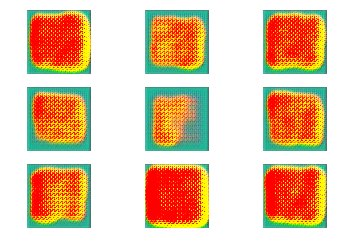

  Epoch: 2, Generator Loss: 1.2292810672911527, Discriminator Loss: [ 0.4155995  0.       ]


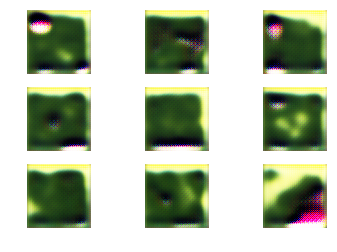

  Epoch: 3, Generator Loss: 0.5233501819632599, Discriminator Loss: [ 0.3924855  0.       ]


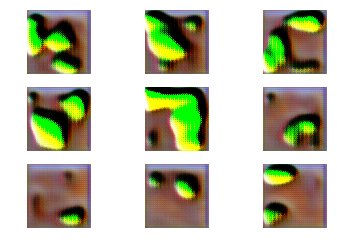

  Epoch: 4, Generator Loss: 1.1574295674250505, Discriminator Loss: [ 0.43563044  0.        ]


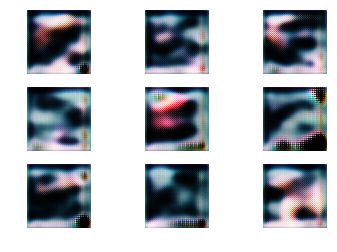

  Epoch: 5, Generator Loss: 1.5287793651223183, Discriminator Loss: [ 0.45902255  0.        ]


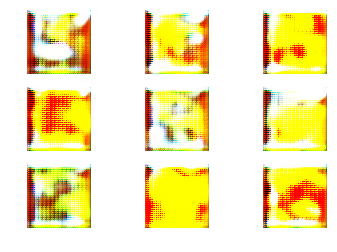

  Epoch: 6, Generator Loss: 0.977630805258996, Discriminator Loss: [ 0.41304892  0.        ]


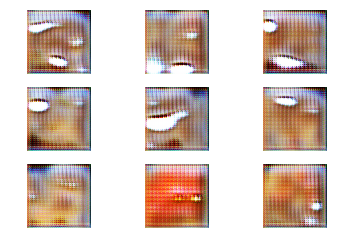

  Epoch: 7, Generator Loss: 0.8866376887798031, Discriminator Loss: [ 0.38768604  0.        ]


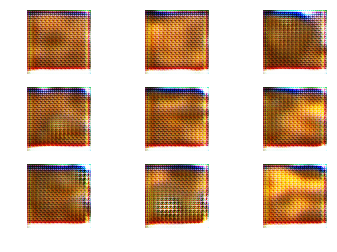

  Epoch: 8, Generator Loss: 0.857787263866897, Discriminator Loss: [ 0.36251664  0.        ]


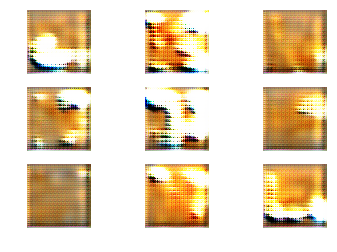

  Epoch: 9, Generator Loss: 1.250580126489295, Discriminator Loss: [ 0.41085532  0.        ]


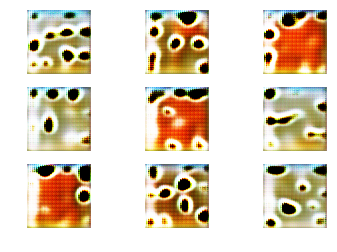

  Epoch: 10, Generator Loss: 1.1735712387990729, Discriminator Loss: [ 0.39129677  0.        ]


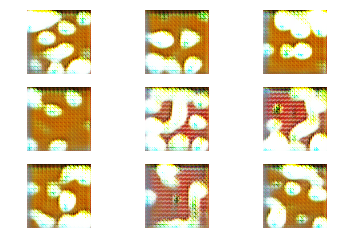

  Epoch: 11, Generator Loss: 1.0509099308575425, Discriminator Loss: [ 0.38653687  0.        ]


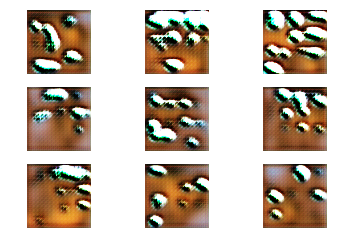

  Epoch: 12, Generator Loss: 0.9137343510149796, Discriminator Loss: [ 0.38506678  0.        ]


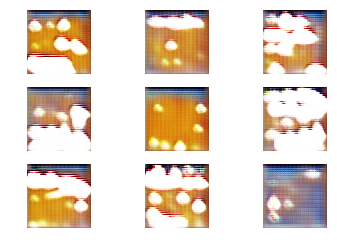

  Epoch: 13, Generator Loss: 0.7464277287858112, Discriminator Loss: [ 0.38211769  0.        ]


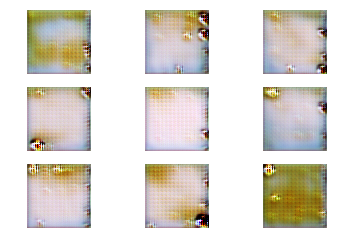

  Epoch: 14, Generator Loss: 1.2286341780639976, Discriminator Loss: [ 0.39359552  0.        ]


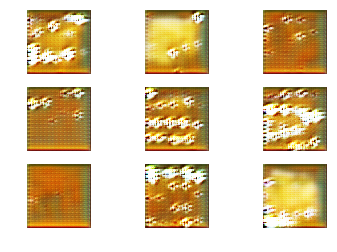

  Epoch: 15, Generator Loss: 1.3852926160896493, Discriminator Loss: [ 0.41517881  0.        ]


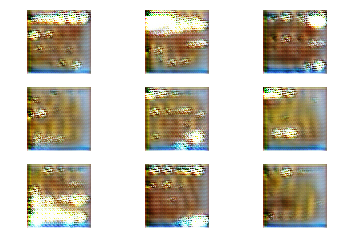

  Epoch: 16, Generator Loss: 1.245984787347718, Discriminator Loss: [ 0.41884255  0.        ]


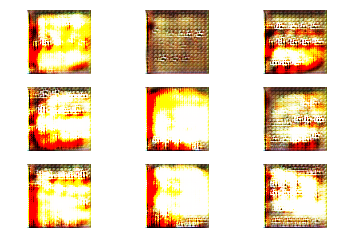

  Epoch: 17, Generator Loss: 1.4317697996499938, Discriminator Loss: [ 0.40567338  0.        ]


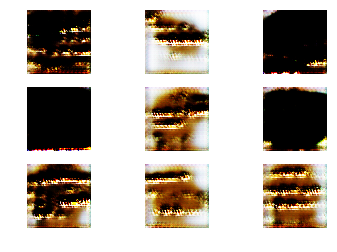

  Epoch: 18, Generator Loss: 1.016388817159372, Discriminator Loss: [ 0.39242056  0.        ]


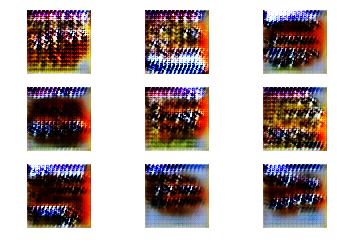

  Epoch: 19, Generator Loss: 1.2422187039367507, Discriminator Loss: [ 0.39460814  0.        ]


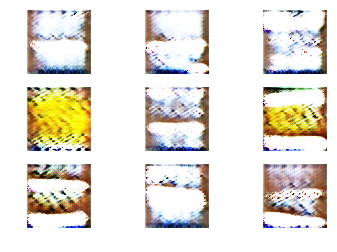

  Epoch: 20, Generator Loss: 0.8702692652434528, Discriminator Loss: [ 0.39312157  0.        ]


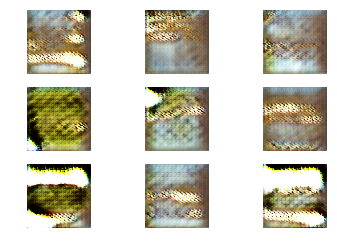

  Epoch: 21, Generator Loss: 1.4779906753694343, Discriminator Loss: [ 0.39704937  0.        ]


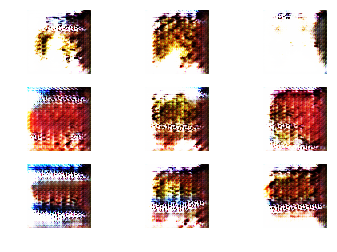

  Epoch: 22, Generator Loss: 1.8142118923296437, Discriminator Loss: [ 0.48104194  0.        ]


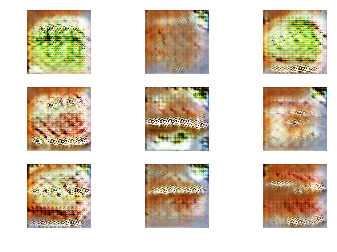

  Epoch: 23, Generator Loss: 1.5412249173098636, Discriminator Loss: [ 0.38836578  0.        ]


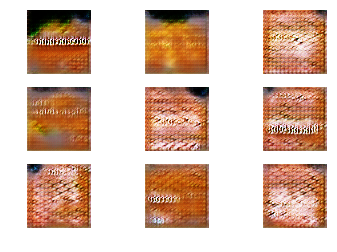

  Epoch: 24, Generator Loss: 1.0946721352079762, Discriminator Loss: [ 0.37972018  0.        ]


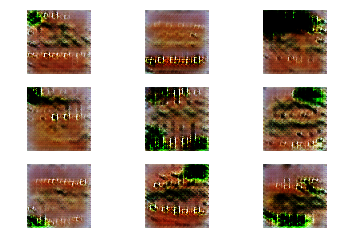

  Epoch: 25, Generator Loss: 0.9363098924405107, Discriminator Loss: [ 0.35212013  0.        ]


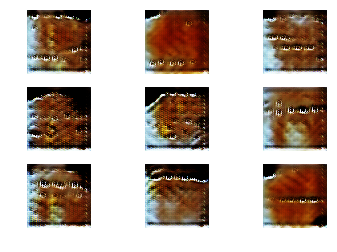

  Epoch: 26, Generator Loss: 1.0219540428892475, Discriminator Loss: [ 0.36838242  0.        ]


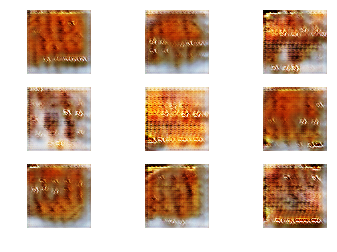

  Epoch: 27, Generator Loss: 0.9425463629799469, Discriminator Loss: [ 0.35932118  0.        ]


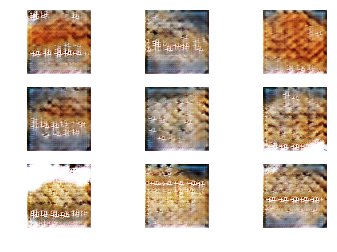

  Epoch: 28, Generator Loss: 1.3103005538268067, Discriminator Loss: [ 0.36074436  0.        ]


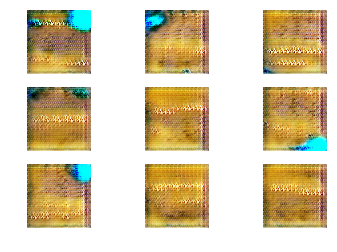

  Epoch: 29, Generator Loss: 1.2971357841775797, Discriminator Loss: [ 0.3437598  0.       ]


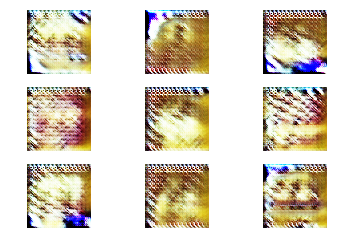

  Epoch: 30, Generator Loss: 2.0734958689067966, Discriminator Loss: [ 0.37132165  0.        ]


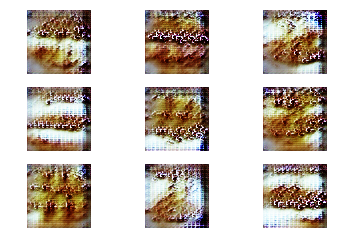

  Epoch: 31, Generator Loss: 1.631174783631463, Discriminator Loss: [ 0.35047951  0.        ]


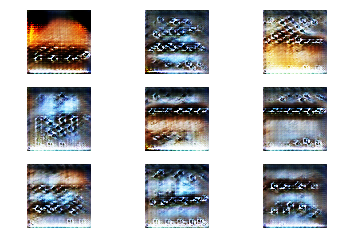

  Epoch: 32, Generator Loss: 1.2379341317671482, Discriminator Loss: [ 0.33898023  0.        ]


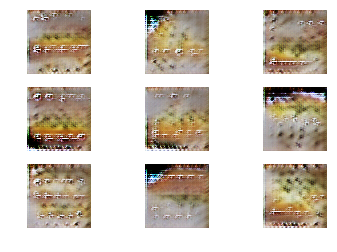

  Epoch: 33, Generator Loss: 1.07582531914672, Discriminator Loss: [ 0.35117146  0.        ]


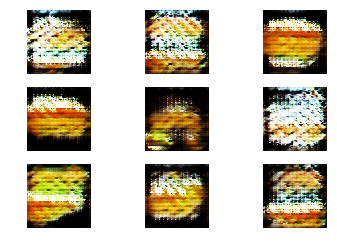

  Epoch: 34, Generator Loss: 1.0810789493756874, Discriminator Loss: [ 0.32546377  0.        ]


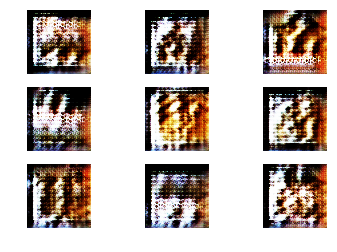

  Epoch: 35, Generator Loss: 1.7046740236126374, Discriminator Loss: [ 0.35152212  0.        ]


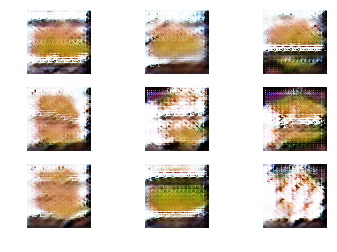

  Epoch: 36, Generator Loss: 1.6960085105394649, Discriminator Loss: [ 0.3423574  0.       ]


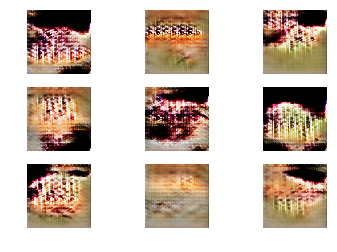

  Epoch: 37, Generator Loss: 1.3172272165941301, Discriminator Loss: [ 0.33048248  0.        ]


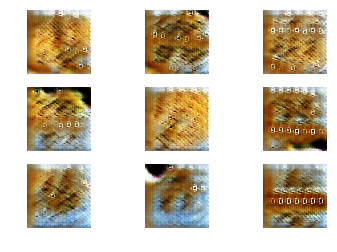

  Epoch: 38, Generator Loss: 1.708248979438131, Discriminator Loss: [ 0.34302473  0.        ]


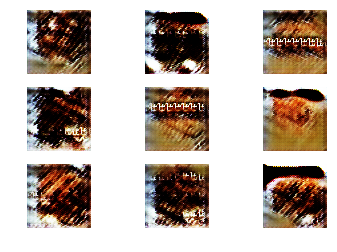

  Epoch: 39, Generator Loss: 1.5435037128279143, Discriminator Loss: [ 0.34273383  0.        ]


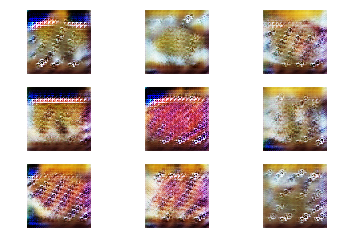

  Epoch: 40, Generator Loss: 1.9624509025260666, Discriminator Loss: [ 0.34244594  0.        ]


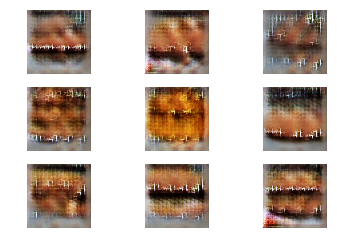

  Epoch: 41, Generator Loss: 1.463298600515194, Discriminator Loss: [ 0.33833638  0.        ]


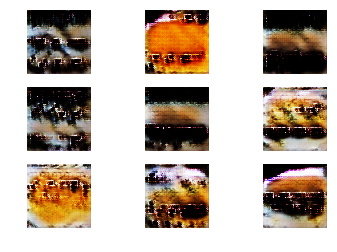

  Epoch: 42, Generator Loss: 1.0819084385288096, Discriminator Loss: [ 0.32254931  0.        ]


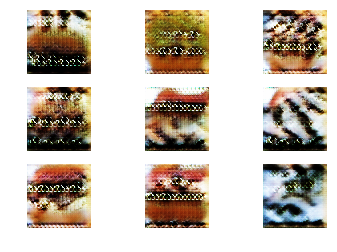

  Epoch: 43, Generator Loss: 0.9983928935062663, Discriminator Loss: [ 0.34855399  0.        ]


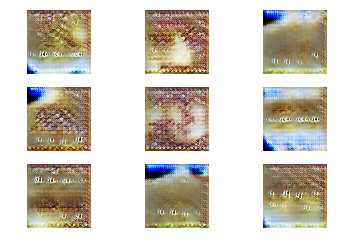

  Epoch: 44, Generator Loss: 1.9547626905352156, Discriminator Loss: [ 0.3548159  0.       ]


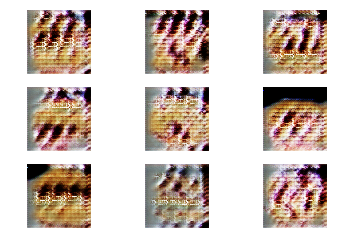

  Epoch: 45, Generator Loss: 1.7430461278864156, Discriminator Loss: [ 0.32909733  0.        ]


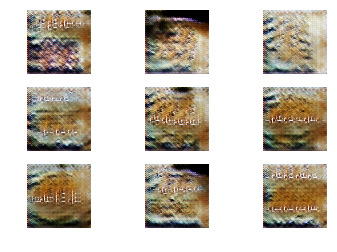

  Epoch: 46, Generator Loss: 1.829247366393281, Discriminator Loss: [ 0.34395128  0.        ]


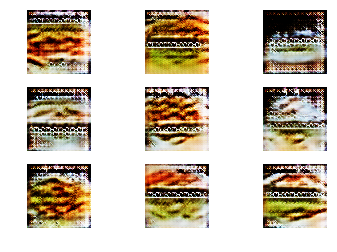

  Epoch: 47, Generator Loss: 1.9024128606804063, Discriminator Loss: [ 0.32570055  0.        ]


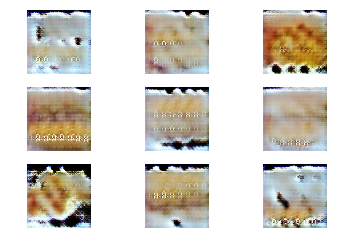

  Epoch: 48, Generator Loss: 1.7194153084376147, Discriminator Loss: [ 0.33368236  0.        ]


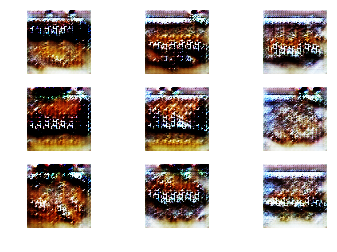

  Epoch: 49, Generator Loss: 2.0710762775389946, Discriminator Loss: [ 0.31394318  0.        ]


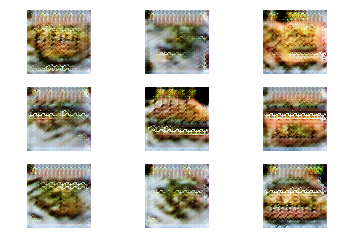

  Epoch: 50, Generator Loss: 2.2799106418529402, Discriminator Loss: [ 0.31806305  0.        ]


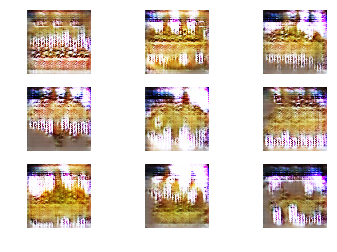

  Epoch: 51, Generator Loss: 2.109078689991871, Discriminator Loss: [ 0.34471837  0.        ]


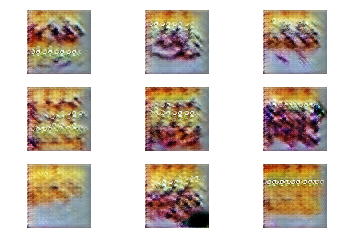

  Epoch: 52, Generator Loss: 1.8926156421548852, Discriminator Loss: [ 0.33995843  0.        ]


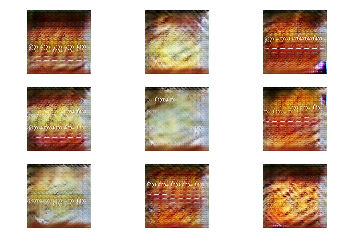

  Epoch: 53, Generator Loss: 2.142050543399615, Discriminator Loss: [ 0.33373082  0.        ]


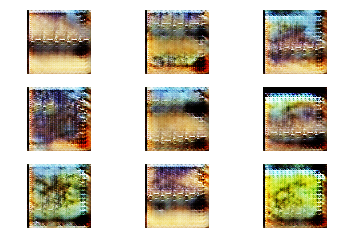

  Epoch: 54, Generator Loss: 1.9366788139967162, Discriminator Loss: [ 0.32943889  0.        ]


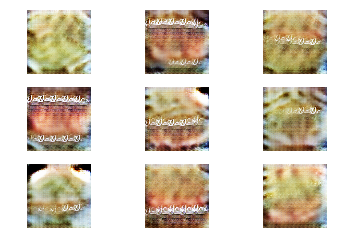

  Epoch: 55, Generator Loss: 2.009790890127699, Discriminator Loss: [ 0.3405664  0.       ]


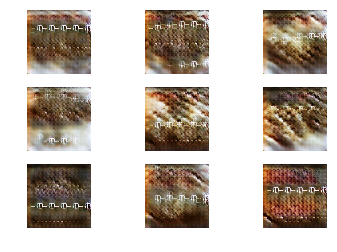

  Epoch: 56, Generator Loss: 1.9875186414362114, Discriminator Loss: [ 0.34402788  0.        ]


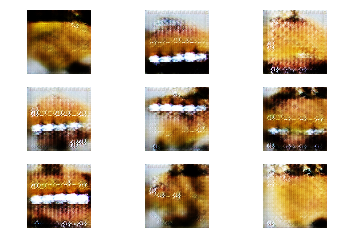

  Epoch: 57, Generator Loss: 2.054454667685188, Discriminator Loss: [ 0.33127138  0.        ]


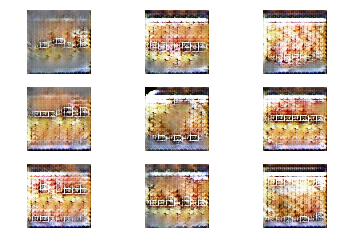

  Epoch: 58, Generator Loss: 1.8421201838928962, Discriminator Loss: [ 0.31293866  0.        ]


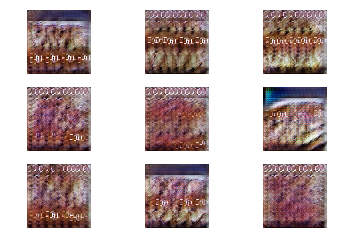

  Epoch: 59, Generator Loss: 1.6822663595743268, Discriminator Loss: [ 0.33081225  0.        ]


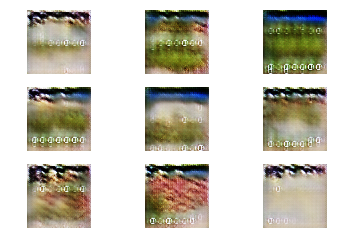

  Epoch: 60, Generator Loss: 1.5706608530099146, Discriminator Loss: [ 0.32917732  0.        ]


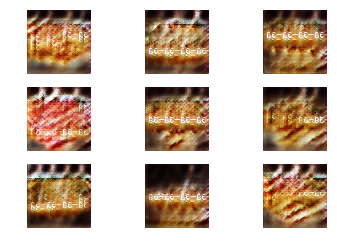

  Epoch: 61, Generator Loss: 1.7386001640948179, Discriminator Loss: [ 0.32444414  0.        ]


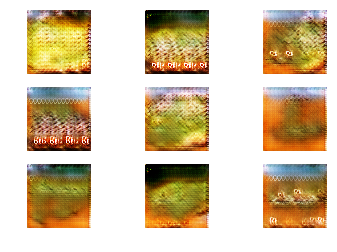

  Epoch: 62, Generator Loss: 2.572267415924607, Discriminator Loss: [ 0.33050126  0.        ]


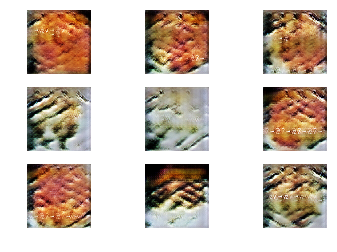

  Epoch: 63, Generator Loss: 1.1876354597717802, Discriminator Loss: [ 0.31876978  0.        ]


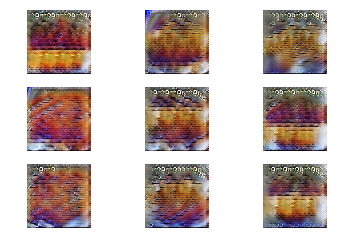

  Epoch: 64, Generator Loss: 1.6097601482244295, Discriminator Loss: [ 0.34339517  0.        ]


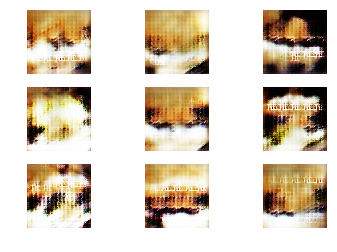

  Epoch: 65, Generator Loss: 1.8742304937304737, Discriminator Loss: [ 0.32446998  0.        ]


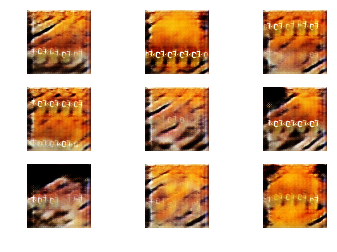

  Epoch: 66, Generator Loss: 1.7810182394546883, Discriminator Loss: [ 0.33264557  0.        ]


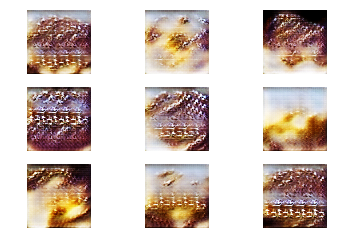

  Epoch: 67, Generator Loss: 2.3317573521738852, Discriminator Loss: [ 0.32298842  0.        ]


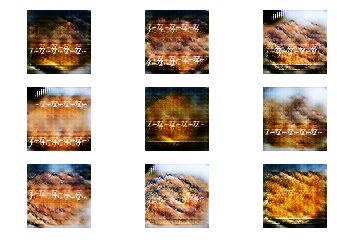

  Epoch: 68, Generator Loss: 1.7356117286971797, Discriminator Loss: [ 0.31870276  0.        ]


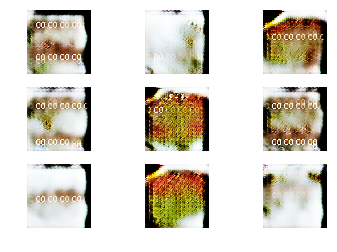

  Epoch: 69, Generator Loss: 2.1558872436251595, Discriminator Loss: [ 0.31790692  0.        ]


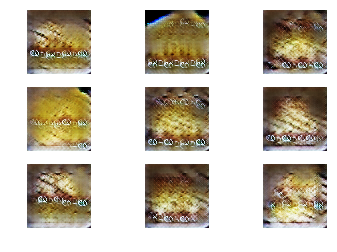

  Epoch: 70, Generator Loss: 1.7230139338524542, Discriminator Loss: [ 0.33739275  0.        ]


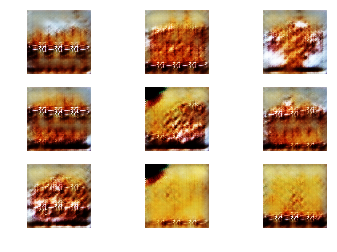

  Epoch: 71, Generator Loss: 1.8280306281608956, Discriminator Loss: [ 0.31890067  0.        ]


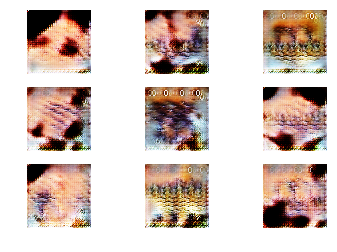

  Epoch: 72, Generator Loss: 2.2077164750232874, Discriminator Loss: [ 0.31783617  0.        ]


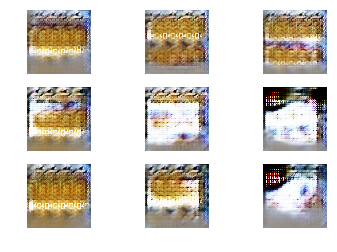

  Epoch: 73, Generator Loss: 2.033938910359534, Discriminator Loss: [ 0.3218047  0.       ]


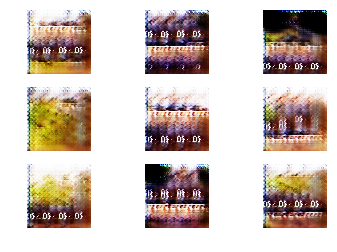

  Epoch: 74, Generator Loss: 2.0087941921202934, Discriminator Loss: [ 0.32575721  0.        ]


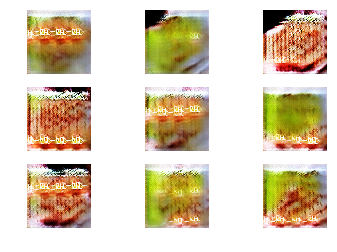

  Epoch: 75, Generator Loss: 2.239856266808287, Discriminator Loss: [ 0.32432503  0.        ]


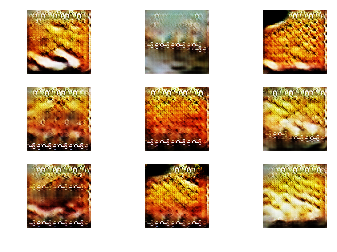

  Epoch: 76, Generator Loss: 2.2038235112885447, Discriminator Loss: [ 0.31671712  0.        ]


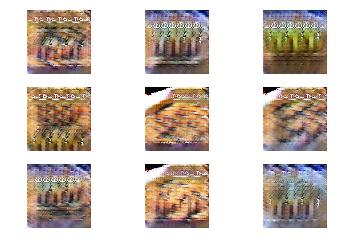

  Epoch: 77, Generator Loss: 2.3332578032930322, Discriminator Loss: [ 0.32017711  0.        ]


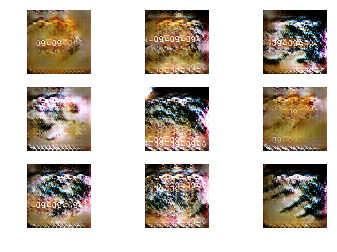

  Epoch: 78, Generator Loss: 2.2706434835340374, Discriminator Loss: [ 0.319989  0.      ]


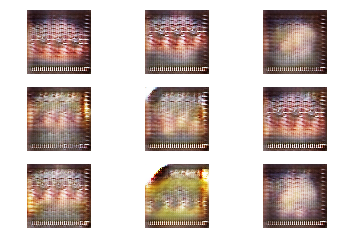

  Epoch: 79, Generator Loss: 2.3039179545975177, Discriminator Loss: [ 0.31557417  0.        ]


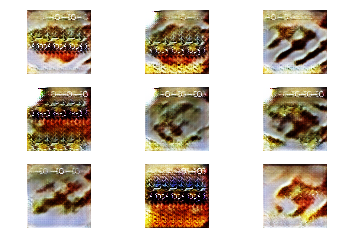

  Epoch: 80, Generator Loss: 2.0524136599536256, Discriminator Loss: [ 0.31829205  0.        ]


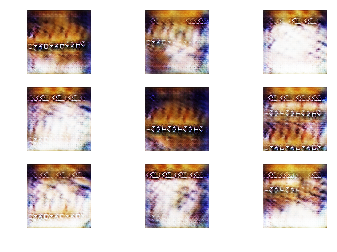

  Epoch: 81, Generator Loss: 1.9171960888621964, Discriminator Loss: [ 0.33019692  0.        ]


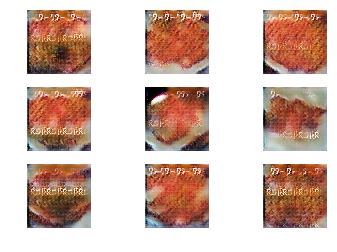

  Epoch: 82, Generator Loss: 2.0015786531094077, Discriminator Loss: [ 0.32318929  0.        ]


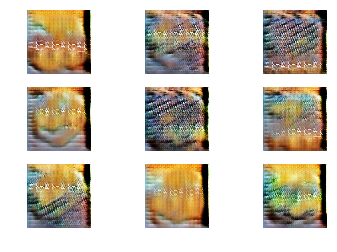

  Epoch: 83, Generator Loss: 1.6586913601538846, Discriminator Loss: [ 0.30906442  0.        ]


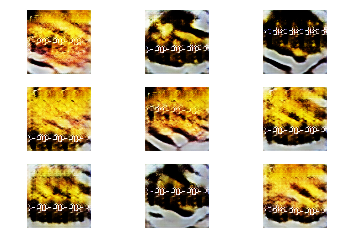

  Epoch: 84, Generator Loss: 2.219796031434959, Discriminator Loss: [ 0.31959829  0.        ]


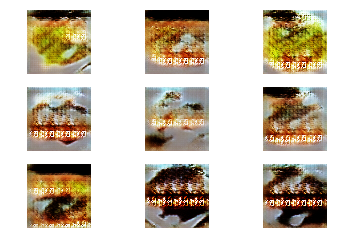

  Epoch: 85, Generator Loss: 1.7010195058918445, Discriminator Loss: [ 0.31555218  0.        ]


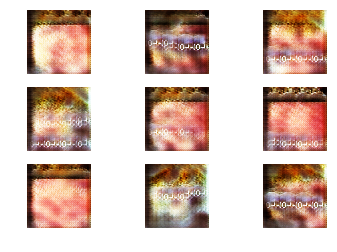

  Epoch: 86, Generator Loss: 2.238398446657947, Discriminator Loss: [ 0.31307399  0.        ]


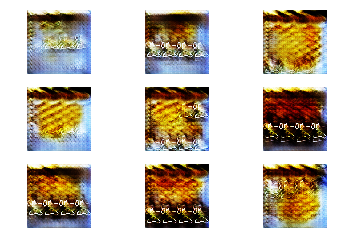

  Epoch: 87, Generator Loss: 2.0977308296154593, Discriminator Loss: [ 0.3136462  0.       ]


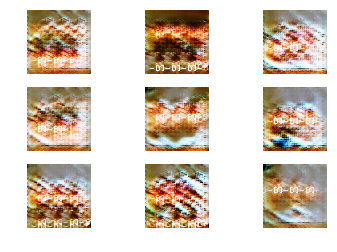

  Epoch: 88, Generator Loss: 1.915043487727085, Discriminator Loss: [ 0.32450891  0.        ]


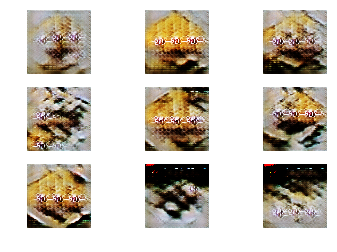

  Epoch: 89, Generator Loss: 2.187227959944823, Discriminator Loss: [ 0.31197682  0.        ]


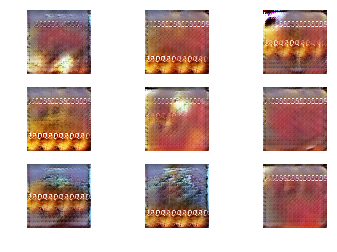

  Epoch: 90, Generator Loss: 2.101408742577116, Discriminator Loss: [ 0.30792314  0.        ]


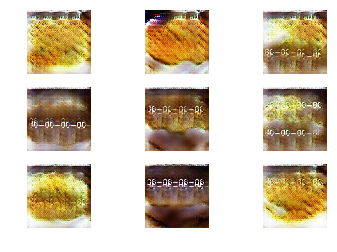

  Epoch: 91, Generator Loss: 2.1097346144580396, Discriminator Loss: [ 0.31553599  0.        ]


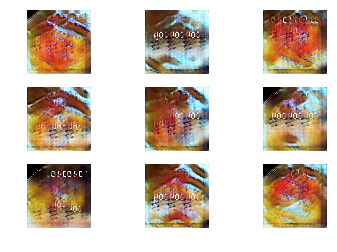

  Epoch: 92, Generator Loss: 2.084079790616704, Discriminator Loss: [ 0.32183644  0.        ]


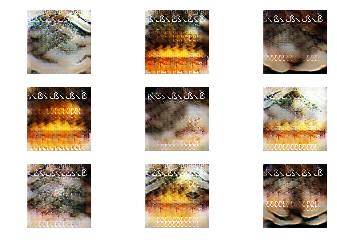

  Epoch: 93, Generator Loss: 2.398367921325648, Discriminator Loss: [ 0.32347199  0.        ]


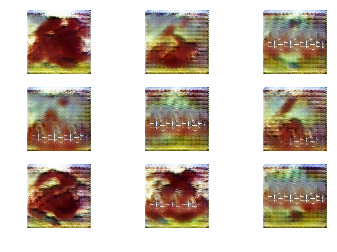

  Epoch: 94, Generator Loss: 2.2015090222670652, Discriminator Loss: [ 0.32392377  0.        ]


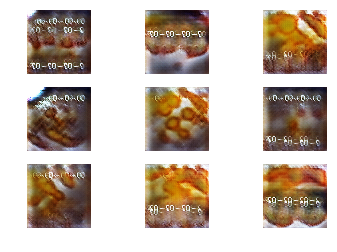

  Epoch: 95, Generator Loss: 2.120156577953668, Discriminator Loss: [ 0.32540801  0.        ]


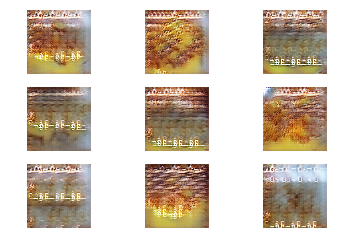

  Epoch: 96, Generator Loss: 1.7859873942961202, Discriminator Loss: [ 0.32054725  0.        ]


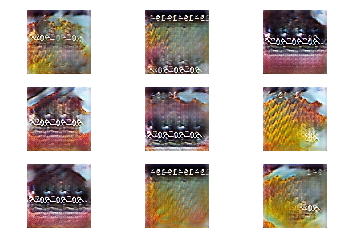

  Epoch: 97, Generator Loss: 2.3329651517288705, Discriminator Loss: [ 0.32051682  0.        ]


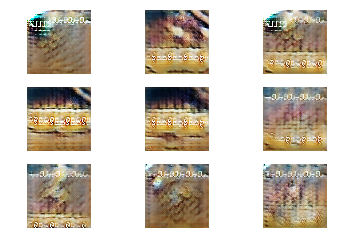

  Epoch: 98, Generator Loss: 2.235741933929586, Discriminator Loss: [ 0.3379792  0.       ]


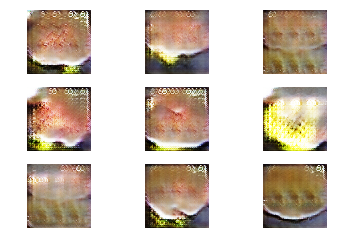

  Epoch: 99, Generator Loss: 2.2236307903984995, Discriminator Loss: [ 0.30316609  0.        ]


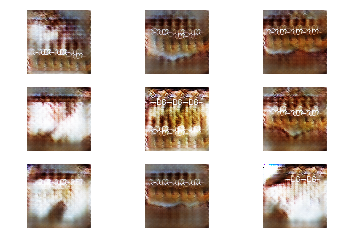

  Epoch: 100, Generator Loss: 2.027589283953203, Discriminator Loss: [ 0.31455198  0.        ]


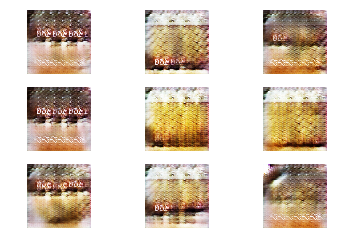

In [11]:
N_EPOCHS = 100
for epoch in range(N_EPOCHS):

    cum_d_loss = 0.
    cum_g_loss = 0.

    for batch_idx in range(num_batches):
        # Get the next set of real images to be used in this iteration
        images = x_data[batch_idx*BATCH_SIZE : (batch_idx+1)*BATCH_SIZE]

        noise_data = generate_noise(BATCH_SIZE, 100)
        generated_images = generator.predict(noise_data)

        # Train on soft labels (add noise to labels as well)
        noise_prop = 0.05 # Randomly flip 5% of labels

        # Prepare labels for real data
        true_labels = np.zeros((BATCH_SIZE, 1)) + np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
        flipped_idx = np.random.choice(np.arange(len(true_labels)), size=int(noise_prop*len(true_labels)))
        true_labels[flipped_idx] = 1 - true_labels[flipped_idx]

        # Train discriminator on real data
        discriminator.trainable = True
        d_loss_true = discriminator.train_on_batch(images, true_labels)

        # Prepare labels for generated data
        gene_labels = np.ones((BATCH_SIZE, 1)) - np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
        flipped_idx = np.random.choice(np.arange(len(gene_labels)), size=int(noise_prop*len(gene_labels)))
        gene_labels[flipped_idx] = 1 - gene_labels[flipped_idx]

        # Train discriminator on generated data
        d_loss_gene = discriminator.train_on_batch(generated_images, gene_labels)

        d_loss = 0.5 * np.add(d_loss_true, d_loss_gene)
        cum_d_loss += d_loss
        discriminator.trainable = False

        # Train generator
        noise_data = generate_noise(BATCH_SIZE, 100)
        g_loss = gan.train_on_batch(noise_data, np.zeros((BATCH_SIZE, 1)))
        cum_g_loss += g_loss

    print('  Epoch: {}, Generator Loss: {}, Discriminator Loss: {}'.format(epoch+1, cum_g_loss/num_batches, cum_d_loss/num_batches))
    show_imgs("epoch" + str(epoch))


In [12]:
## Get PSNR

In [13]:
def display_imgs(imgs):
    ax_n = int(len(imgs)**0.5)
    fig, axs = plt.subplots(ax_n, ax_n)
    count = 0
    for i in range(ax_n):
        for j in range(ax_n):
            img = image.array_to_img(imgs[count], scale=True)
            axs[i,j].imshow(img)
            axs[i,j].axis('off')
            count += 1
    plt.show()
    plt.close()  

In [14]:
def random_subset(iterator, K):
    result = []
    N = 0

    for item in iterator:
        N += 1
        if len(result) < K:
            result.append(item)
        else:
            s = int(random.random() * N)
            if s < K:
                result[ s ] = item

    return np.asarray(result)

In [15]:
def create_imgs(n):
    noise = generate_noise(n, 100)
    gen_imgs = generator.predict(noise)
    print('Generated images')
    display_imgs(gen_imgs)
    return gen_imgs
    
def find_ref_imgs(n):
    ref_imgs = random_subset(x_datax, n)
    print('Reference images')
    display_imgs(ref_imgs)
    return ref_imgs

In [16]:
import math

def psnr(img1, img2):
    mse = np.mean( (img1 - img2) ** 2 )
    if mse == 0:
        return 1000
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

In [17]:
x_allx = np.concatenate((x_train_date, x_val_date, x_test_date))
y_allx = np.concatenate((y_train_date, y_val_date, y_test_date))

x_datax = x_allx[y_allx[:,0]==selected_class]
x_datax = (x_datax - 127.5) / 127.5

Generated images


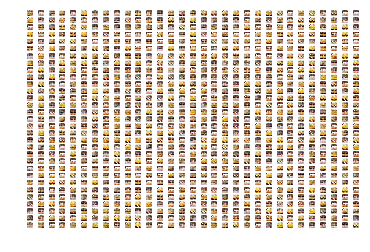

Reference images


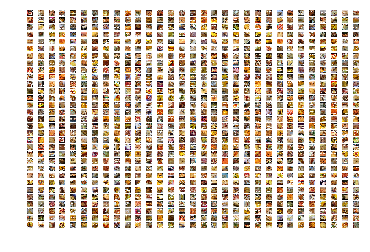

51.169211001528055


In [18]:
n_imgs = 1000

xxx = create_imgs(n_imgs)
yyy = find_ref_imgs(n_imgs)
d_sum = 0
for i in range(n_imgs):
    genimg = np.asarray([xxx[i]])
    refimg = np.asarray([yyy[i]])
    d=psnr(genimg,refimg)
#     print(i+1, ' psnr =', d)
    d_sum+=d
print(d_sum/n_imgs)